## Backpropagation Exercise
In this exercise we will use backpropagation to train a multi-layer perceptron (with a single hidden layer).  Neural Networks are capable of capturing non-linear. We will experiment with different patterns and see how quickly or slowly the weights converge.  We will see the impact and interplay of different parameters such as learning rate, number of iterations, and number of data points.

In [1]:
#Preliminaries
from __future__ import division, print_function
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Fill out the code below so that it creates a multi-layer perceptron with a single hidden layer (with 4 nodes) and trains it via back-propagation.  Specifically your code should:

1. Initialize the weights to random values between -1 and 1
1. Perform the feed-forward computation
1. Compute the loss function
1. Calculate the gradients for all the weights via back-propagation
1. Update the weight matrices (using a learning_rate parameter)
1. Execute steps 2-5 for a fixed number of iterations
1. Plot the accuracies and log loss and observe how they change over time


Once your code is running, try it for the different patterns below.

- Which patterns was the neural network able to learn quickly and which took longer?
- What learning rates and numbers of iterations worked well?
- If you have time, try varying the size of the hidden layer and experiment with different activation functions (e.g. ReLu)

shape of x_mat_full is (500, 3)
shape of y is (500,)


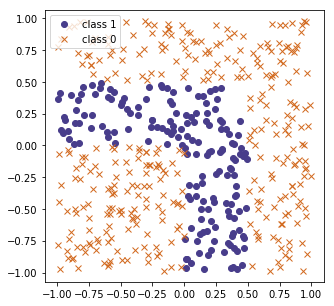

In [7]:
## This code below generates two input values (x) and an output value (y) according to different patterns that are not linear
## It also creates a "bias" term (a vector of 1s)
## The goal is then to learn the mapping from x to y using a neural network via back-propagation

num_obs = 500
x = np.random.uniform(-1,1,size = (num_obs,2))
bias = np.ones((num_obs,1))
x = np.concatenate( (x,bias), axis=1)

# PICK ONE PATTERN BELOW and comment out the rest.

# # Circle pattern
# y = (np.sqrt(x_mat_full[:,0]**2 + x_mat_full[:,1]**2)<.75).astype(int)

# # Diamond Pattern
y = ((np.abs(x_mat_full[:,0]) + np.abs(x_mat_full[:,1]))<1).astype(int)

# # Centered square
# y = ((np.maximum(np.abs(x_mat_full[:,0]), np.abs(x_mat_full[:,1])))<.5).astype(int)

# # Thick Right Angle pattern
# y = (((np.maximum((x_mat_full[:,0]), (x_mat_full[:,1])))<.5) & ((np.maximum((x_mat_full[:,0]), (x_mat_full[:,1])))>-.5)).astype(int)

# # Thin right angle pattern
# y = (((np.maximum((x_mat_full[:,0]), (x_mat_full[:,1])))<.5) & ((np.maximum((x_mat_full[:,0]), (x_mat_full[:,1])))>0)).astype(int)


print('shape of x_mat_full is {}'.format(x_mat_full.shape))
print('shape of y is {}'.format(y.shape))

fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(x_mat_full[y==1, 0],x_mat_full[y==1, 1], 'ro', label='class 1', color='darkslateblue')
ax.plot(x_mat_full[y==0, 0],x_mat_full[y==0, 1], 'bx', label='class 0', color='chocolate')
# ax.grid(True)
ax.legend(loc='best')
ax.axis('equal');

The sigmoid function introduces non-linearity

In [30]:
def sigmoid(x):
    """
    Sigmoid function
    """
    return 1.0 / (1.0 + np.exp(-x))

def sigmoid_derivative(x):
    """ 
    Derivative of the sigmoid function
    """
    return sigmoid(x)*(1-sigmoid(x))

def loss_fn(y_true, y_pred, eps=1e-16):
    """
    Loss function we would like to optimize (minimize)
    We are using Logarithmic Loss
    http://scikit-learn.org/stable/modules/model_evaluation.html#log-loss
    """
    y_pred = np.maximum(y_pred,eps)
    y_pred = np.minimum(y_pred,(1-eps))
    return -(np.sum(y_true * np.log(y_pred)) + np.sum((1-y_true)*np.log(1-y_pred)))/len(y_true)


def forward_pass(W_1, W_2):
    """
    Does a forward computation of the neural network
    Takes the input `x` (global variable) and produces the output `y_pred`
    Also produces the gradient of the log loss function
    """
    global x
    global y
    
    # First, compute the new predictions `y_pred`
    z_1 = np.dot(x, W_1)
    a_1 = sigmoid(z_1)
    z_2 = np.dot(a_1, W_2)
    a_2 = sigmoid(z_2)
    y_pred = a_2.reshape((len(x_mat),))
    
    # Now compute the error and backpropagate it to obtain the gradients
    error = y - y_pred
    delta_2 = np.dot(error, sigmoid_derivative(a_2))
    
    intermediate_error = np.dot(W_2_grad, W_2.T)
    delta_1 = np.dot(intermediate_error, sigmoid_derivative(a_1))
    
    W_1_grad = np.dot(delta_1, x.T)
    W_2_grad = np.dot(delta_2, a_1.T)
    
    gradient = (W_1_grad, W_2_grad)
    return y_pred, gradient


def plot_loss_accuracy(loss_vals, accuracies):
    fig = plt.figure(figsize=(16, 8))
    fig.suptitle('Log Loss and Accuracy over iterations')
    
    ax = fig.add_subplot(1, 2, 1)
    ax.plot(loss_vals)
    ax.grid(True)
    ax.set(xlabel='iterations', title='Log Loss')
    
    ax = fig.add_subplot(1, 2, 2)
    ax.plot(accuracies)
    ax.grid(True)
    ax.set(xlabel='iterations', title='Accuracy');

Complete the pseudocode below. First, initialise the parameters. This means determining the following

### Size of the network

Hidden layers (or a single hidden layer in this example) can be any size. Layers with more neurons are more likely to overfit, and take longer to train.
The output layer size corresponds to the number of classes.

### Number of iterations

This parameter determines how many times the network will be updated. 

### Learning rate

Each time we update the weights, we do so by taking a step into the direction that we calculated will improve the accuracy of the network. The size of that step is determined by the learning rate. Taking small steps will slow the process down, but taking steps that are too large can cause results to vary wildly and not reach a stable optimum. 

In [31]:
#### Initialize the parameters of the network


# Create random input and output data
x = np.random.randn(num_iter, input_size)
y = np.random.randn(num_iter, output_size)

np.random.seed(1241)
input_size=2
# The hidden layer can have any size (= number of neurons). Note that a larger network will takes longer to train
hidden_size = 3
# The output layer has size 2 because there are two classes
output_size = 2

# The weight 1 matrix has the size input size * hidden size 
# The weight 2 matrix has the size input hidden size * output 
# The initial values for the weights are random numbers
W_1 =W1 = np.random.randn(input_size, hidden_size)
W_2 = W2 = np.random.randn(hidden_size, output_size)

#w1 = np.random.randn(input_size, hidden_size)
#w2 = np.random.randn(hidden_size, output_size)
# The number of iterations is the number of times you update the weights
num_iter = 1000
# The learning rate is the size of the update
learning_rate = 100


0 2621.7793301804504
1 2621.7793301804504
2 2621.7793301804504
3 2621.7793301804504
4 2621.7793301804504
5 2621.7793301804504
6 2621.7793301804504
7 2621.7793301804504
8 2621.7793301804504
9 2621.7793301804504
10 2621.7793301804504
11 2621.7793301804504
12 2621.7793301804504
13 2621.7793301804504
14 2621.7793301804504
15 2621.7793301804504
16 2621.7793301804504
17 2621.7793301804504
18 2621.7793301804504
19 2621.7793301804504
20 2621.7793301804504
21 2621.7793301804504
22 2621.7793301804504
23 2621.7793301804504
24 2621.7793301804504


C:\Users\ramonic\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


25 2621.7793301804504
26 2621.7793301804504
27 2621.7793301804504
28 2621.7793301804504
29 2621.7793301804504
30 2621.7793301804504
31 2621.7793301804504
32 2621.7793301804504
33 2621.7793301804504
34 2621.7793301804504
35 2621.7793301804504
36 2621.7793301804504
37 2621.7793301804504
38 2621.7793301804504
39 2621.7793301804504
40 2621.7793301804504
41 2621.7793301804504
42 2621.7793301804504
43 2621.7793301804504
44 2621.7793301804504
45 2621.7793301804504
46 2621.7793301804504
47 2621.7793301804504
48 2621.7793301804504
49 2621.7793301804504
50 2621.7793301804504
51 2621.7793301804504
52 2621.7793301804504
53 2621.7793301804504
54 2621.7793301804504
55 2621.7793301804504
56 2621.7793301804504
57 2621.7793301804504
58 2621.7793301804504
59 2621.7793301804504
60 2621.7793301804504
61 2621.7793301804504
62 2621.7793301804504
63 2621.7793301804504
64 2621.7793301804504
65 2621.7793301804504
66 2621.7793301804504
67 2621.7793301804504
68 2621.7793301804504
69 2621.7793301804504
70 2621.77

387 2621.7793301804504
388 2621.7793301804504
389 2621.7793301804504
390 2621.7793301804504
391 2621.7793301804504
392 2621.7793301804504
393 2621.7793301804504
394 2621.7793301804504
395 2621.7793301804504
396 2621.7793301804504
397 2621.7793301804504
398 2621.7793301804504
399 2621.7793301804504
400 2621.7793301804504
401 2621.7793301804504
402 2621.7793301804504
403 2621.7793301804504
404 2621.7793301804504
405 2621.7793301804504
406 2621.7793301804504
407 2621.7793301804504
408 2621.7793301804504
409 2621.7793301804504
410 2621.7793301804504
411 2621.7793301804504
412 2621.7793301804504
413 2621.7793301804504
414 2621.7793301804504
415 2621.7793301804504
416 2621.7793301804504
417 2621.7793301804504
418 2621.7793301804504
419 2621.7793301804504
420 2621.7793301804504
421 2621.7793301804504
422 2621.7793301804504
423 2621.7793301804504
424 2621.7793301804504
425 2621.7793301804504
426 2621.7793301804504
427 2621.7793301804504
428 2621.7793301804504
429 2621.7793301804504
430 2621.77

749 2621.7793301804504
750 2621.7793301804504
751 2621.7793301804504
752 2621.7793301804504
753 2621.7793301804504
754 2621.7793301804504
755 2621.7793301804504
756 2621.7793301804504
757 2621.7793301804504
758 2621.7793301804504
759 2621.7793301804504
760 2621.7793301804504
761 2621.7793301804504
762 2621.7793301804504
763 2621.7793301804504
764 2621.7793301804504
765 2621.7793301804504
766 2621.7793301804504
767 2621.7793301804504
768 2621.7793301804504
769 2621.7793301804504
770 2621.7793301804504
771 2621.7793301804504
772 2621.7793301804504
773 2621.7793301804504
774 2621.7793301804504
775 2621.7793301804504
776 2621.7793301804504
777 2621.7793301804504
778 2621.7793301804504
779 2621.7793301804504
780 2621.7793301804504
781 2621.7793301804504
782 2621.7793301804504
783 2621.7793301804504
784 2621.7793301804504
785 2621.7793301804504
786 2621.7793301804504
787 2621.7793301804504
788 2621.7793301804504
789 2621.7793301804504
790 2621.7793301804504
791 2621.7793301804504
792 2621.77

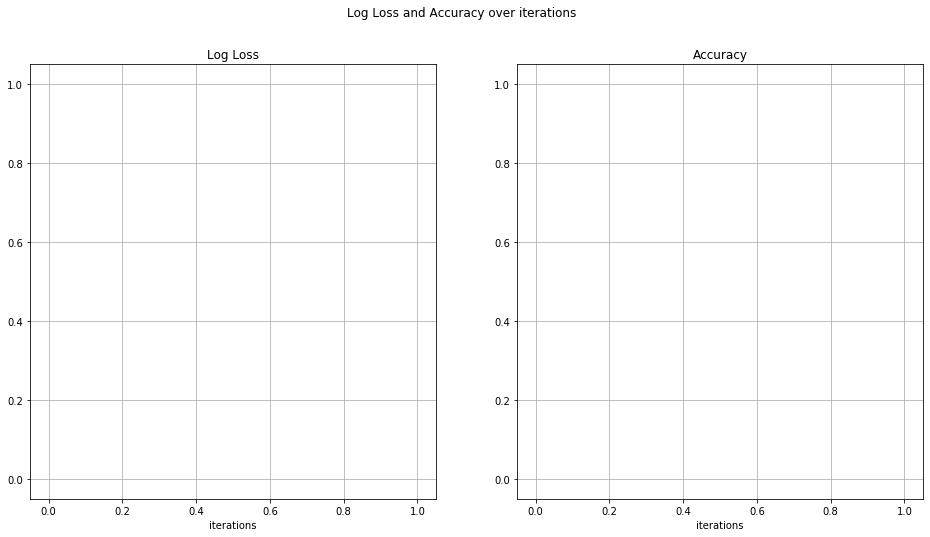

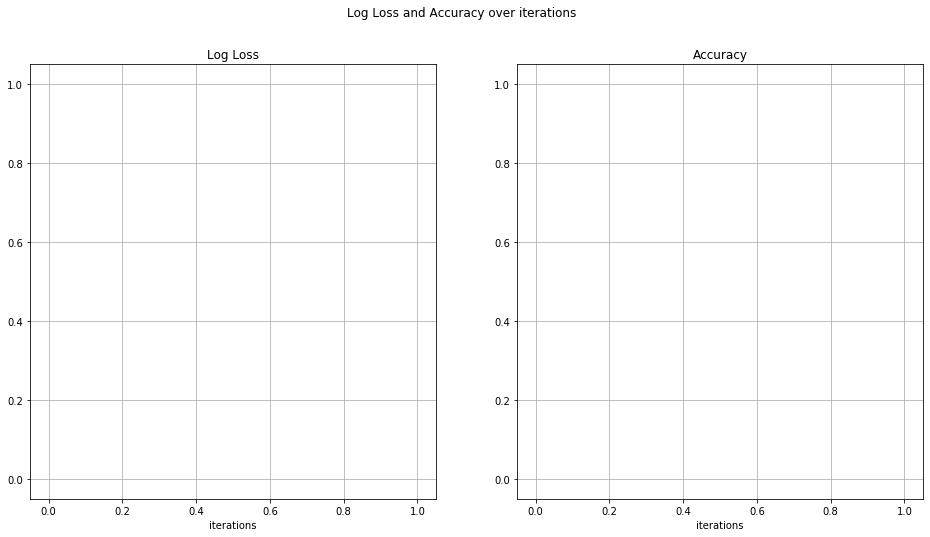

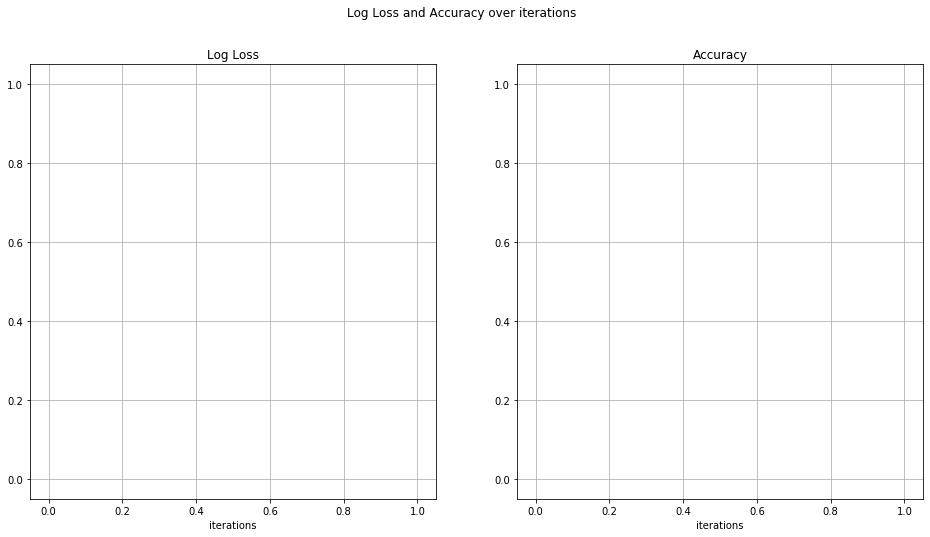

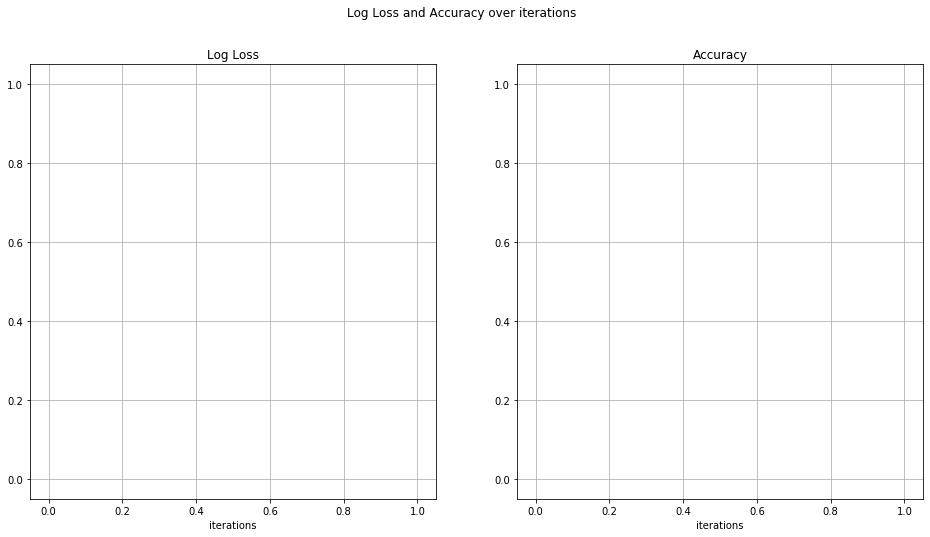

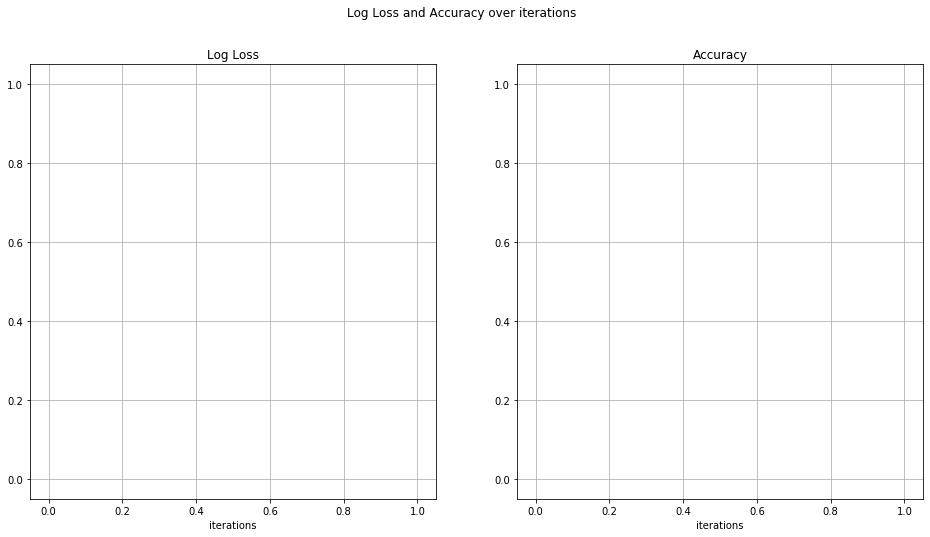

...

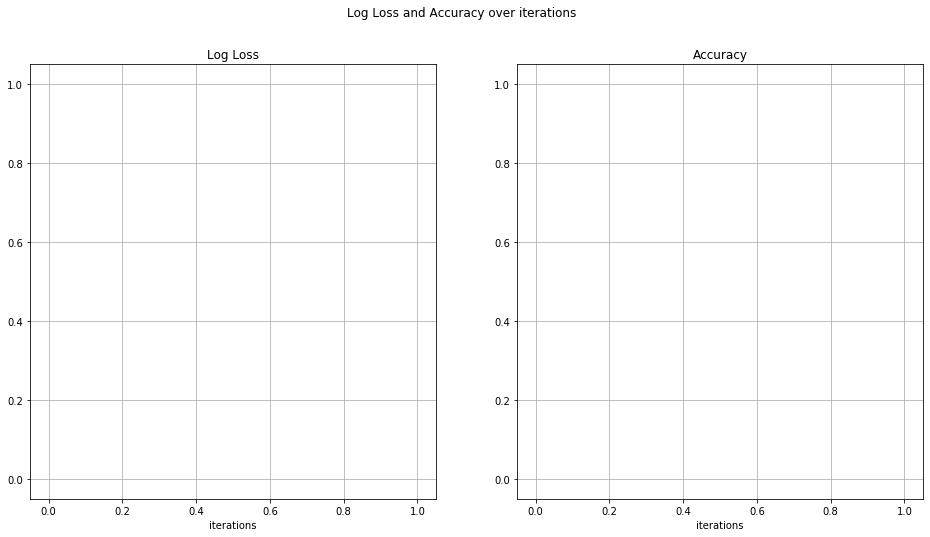

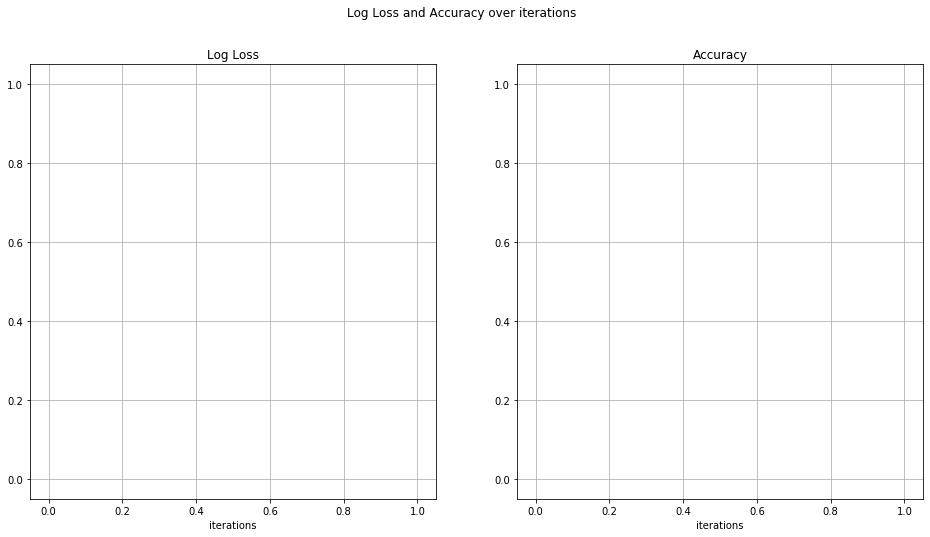

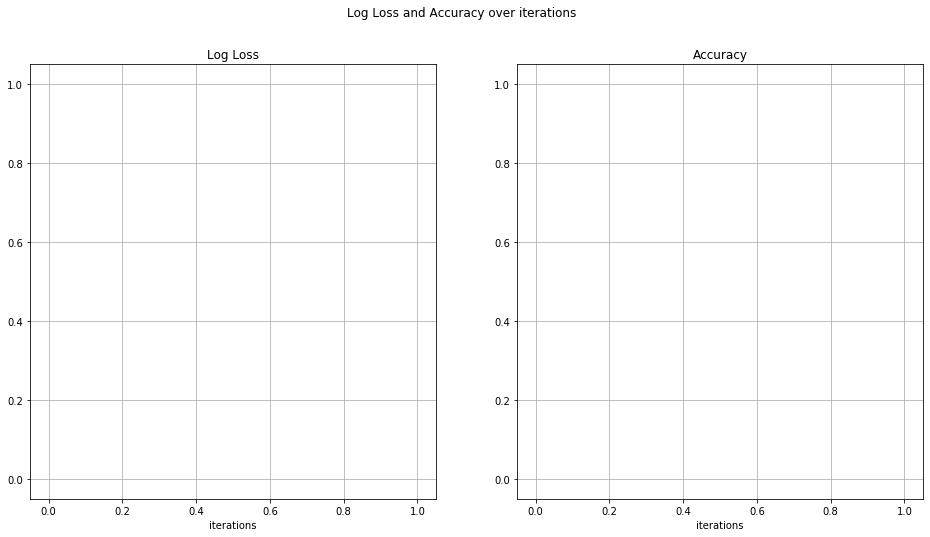

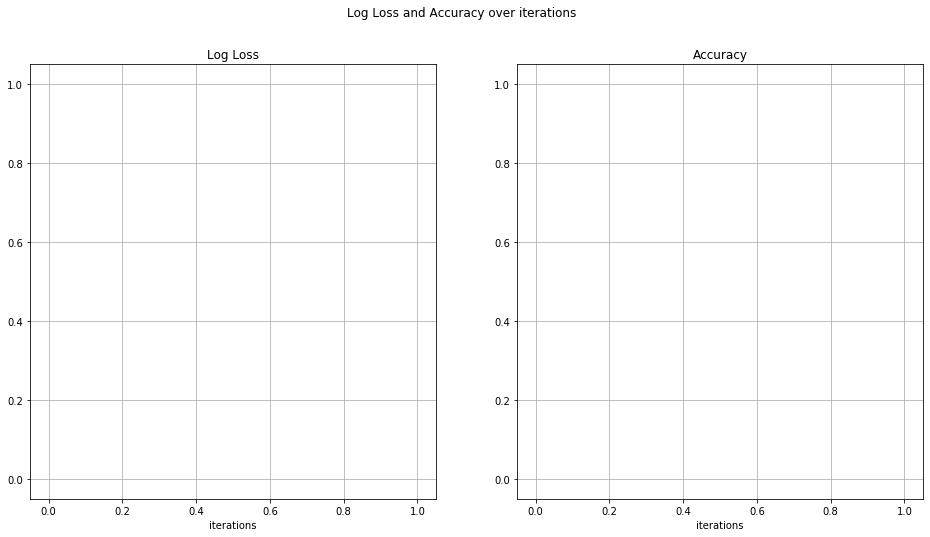

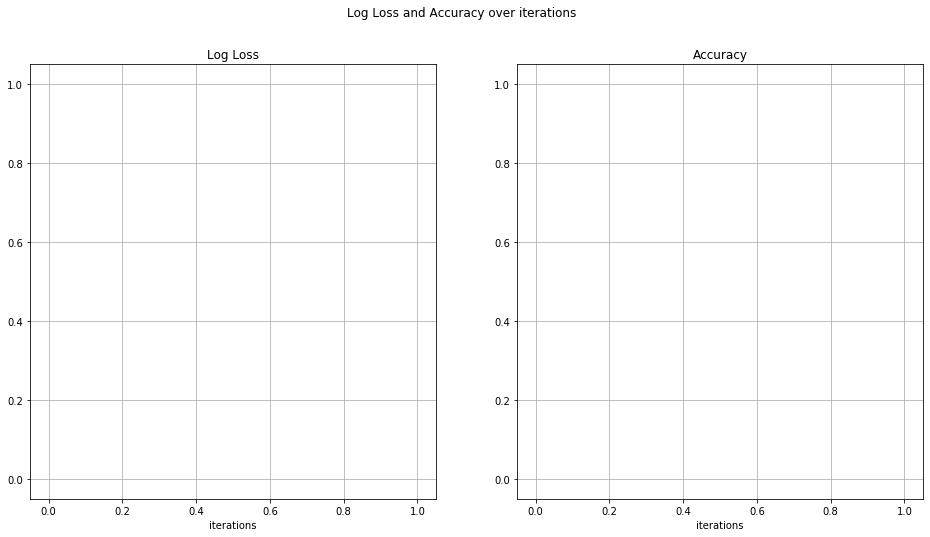

In [39]:

loss_vals, accuracies = [], []
for i in range(num_iter):
    ### Do a forward computation, and get the gradients
    h = x.dot(W_1)
    h_relu = np.maximum(h, 0)
    y_pred = h_relu.dot(W_2)
    ## Update the weight matrices by simply adding the gradients to them
    grad_y_pred = 2.0 * (y_pred - y)
    grad_w2 = h_relu.T.dot(grad_y_pred)
    grad_h_relu = grad_y_pred.dot(W_2.T)
    grad_h = grad_h_relu.copy()
    grad_h[h < 0] = 0
    grad_w1 = x.T.dot(grad_h)
    ### Compute the loss and accuracy
    loss = np.square(y_pred - y).sum()
    print(i, loss)
    ## Print the loss and accuracy for every 200th iteration
    plot_loss_accuracy(loss_vals, accuracies)